In [2]:
%load_ext autoreload
%autoreload 2
import sys
sys.path.append("../")
import tensorflow as tf
import h5py, os, yaml
import umap.umap_ as umap
import numpy as np
import matplotlib.pyplot as plt
import re
import seaborn as sns
from scipy import stats
from test_to_bw_fast import read_model, get_config
import pandas as pd
import matplotlib.patches as patches
from tensorflow import keras
import plotly.express as px
import tfr_evaluate, util
import subprocess
import explain
from tqdm import tqdm
import glob
import embed
from scipy.stats import pearsonr
import metrics

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [3]:
# load and get model layer
run_path = '../'+'paper_runs/new_models/32_res/run-20211023_095131-w6okxt01'
# run_path ='../paper_runs/new_models/32_res/run-20211023_095137-ixzgndsj'
# run_path = '../paper_runs/basenji/binloss_basenji/run-20210920_034449-8p51o3ho'
layer = -3
model, bin_size = read_model(run_path, compile_model=False)
aux_model = tf.keras.Model(inputs=model.inputs, outputs=model.layers[layer].output)
    

In [4]:
aux_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
sequence (InputLayer)           [(None, 2048, 4)]    0                                            
__________________________________________________________________________________________________
conv1d (Conv1D)                 (None, 2048, 256)    19712       sequence[0][0]                   
__________________________________________________________________________________________________
batch_normalization (BatchNorma (None, 2048, 256)    1024        conv1d[0][0]                     
__________________________________________________________________________________________________
filter_activation (Activation)  (None, 2048, 256)    0           batch_normalization[0][0]        
______________________________________________________________________________________________

In [7]:
# load and threshold data
testset, targets = tfr_evaluate.collect_whole_testset(coords=True)
threshold = 2
cell_line = 13
print(targets[cell_line])
thresholded_C, thresholded_X, thresholded_Y = embed.threshold_cell_line_testset(testset, cell_line, more_than=threshold)
idr_class = embed.label_idr_peaks(thresholded_C, cell_line)
predictions = embed.predict_np(thresholded_X, model, batch_size=32, reshape_to_2D=False)
thresholded_Y.shape

PC-3


(23346, 2048)

In [261]:
# get low coverage sequences and corresponding predictions
# low_coords, low_seqs, low_cov = embed.threshold_cell_line_testset(testset, cell_line, 0.5, less_than=2)
# low_pred = embed.predict_np(low_seqs, model, batch_size=32, reshape_to_2D=False)

In [8]:
# get inttermediate representation embeddings and predictions
interm_representations = embed.predict_np(thresholded_X, aux_model, batch_size=32, reshape_to_2D=True)
embeddings = embed.get_embeddings(interm_representations)
embeddings['IDR'] = idr_class
embeddings['cell line'] = targets[cell_line]


In [324]:
# np.save('low_seqs', low_seqs)
# np.save('low_cov', low_cov)
# np.save('low_pred', low_pred)
# np.save('embeddings', embeddings)

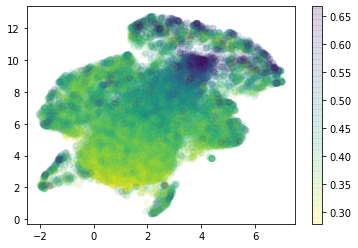

In [12]:
GC_content_all = embed.get_GC_content(thresholded_X)
embeddings['GC content'] = GC_content_all

plt.scatter(x=embeddings['UMAP 1'], 
                y=embeddings['UMAP 2'],
                alpha=0.1,
                c=embeddings['GC content'],
               cmap='viridis_r')
plt.clim(np.percentile(GC_content_all, 1),np.percentile(GC_content_all, 99))
c = plt.colorbar()
# plt.legend(bbox_to_anchor=(1,1));

In [13]:
np_C, np_X, np_Y = util.convert_tfr_to_np(testset, 3)

In [ ]:
# load and threshold data
all_emb = []
# testset, targets = tfr_evaluate.collect_whole_testset(coords=True)
threshold = 2
for cell_line in tqdm(range(15)):
    thresholded_C, thresholded_X, thresholded_Y = embed.threshold_cell_line_np(np_C, np_X, np_Y, cell_line, more_than=threshold)
    idr_class = embed.label_idr_peaks(thresholded_C, cell_line)
    predictions = embed.predict_np(thresholded_X, model, batch_size=32, reshape_to_2D=False)
    thresholded_Y.shape
    interm_representations = embed.predict_np(thresholded_X, aux_model, batch_size=32, reshape_to_2D=True)
    embeddings = embed.get_embeddings(interm_representations)
    embeddings['IDR'] = idr_class
    embeddings['cell line'] = targets[cell_line]
    all_emb.append(embeddings)



 47%|████▋     | 7/15 [1:14:25<1:22:41, 620.23s/it]

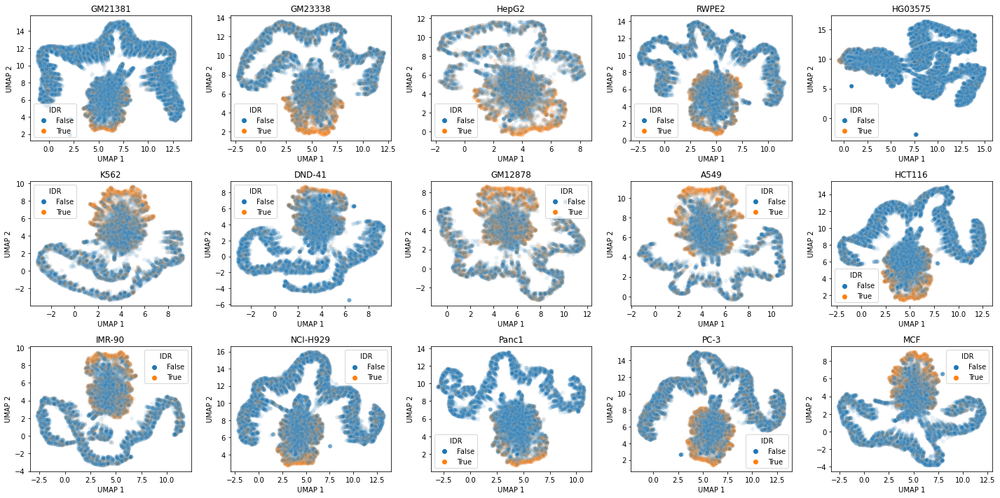

In [88]:
df = pd.concat(all_emb)
fig = plt.figure(figsize=[20,10])
nrows, ncols = 3, 5
for i, df in enumerate(all_emb):
    ax = fig.add_subplot(nrows, ncols, i+1)
    sns.scatterplot(data=df, x='UMAP 1', y='UMAP 2', hue='IDR', ax=ax, alpha=0.1)
    ax.set_title(targets[i])
plt.tight_layout()


# HepG2

HepG2
Choosing only IDR
420


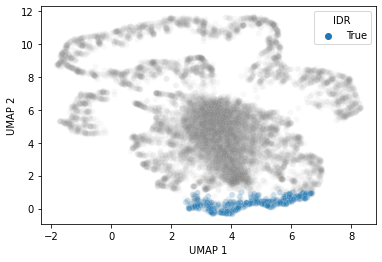

In [96]:
cell_line = 2
print(targets[cell_line])
embeddings = all_emb[cell_line]
sns.scatterplot(data=embeddings, x='UMAP 1', y='UMAP 2', color='grey', alpha=0.05)
selected = embed.select(embeddings,lower_lim_1=2, upper_lim_1=7, upper_lim_2=1, idr='y')
sns.scatterplot(data=embeddings[selected], x='UMAP 1', y='UMAP 2', hue='IDR', alpha=0.2)
selected_ids = list(embeddings[selected].index)
print(len(selected_ids))

HepG2


../explain.py:972: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1,figsize=[20, 2])


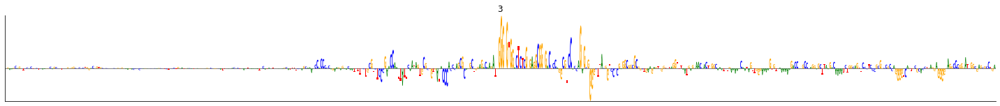

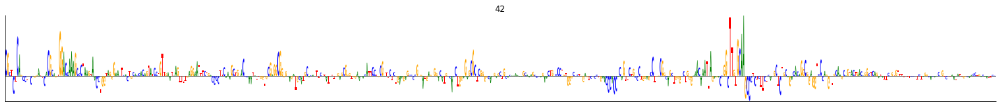

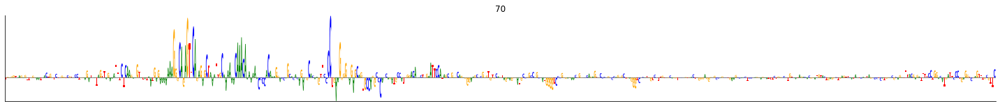

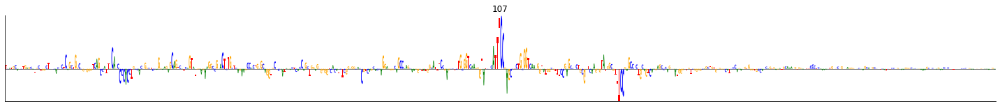

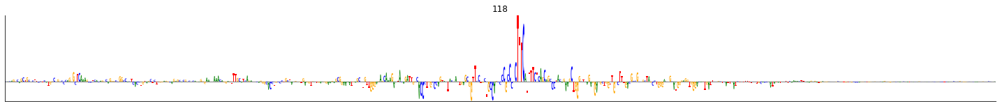

...

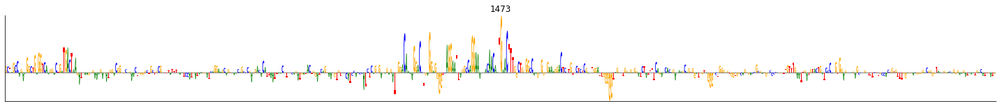

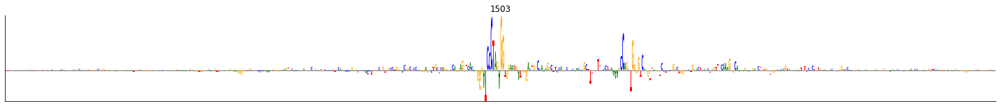

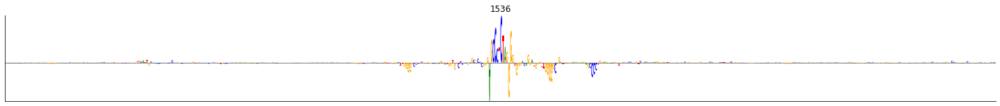

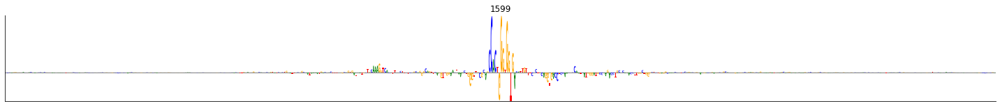

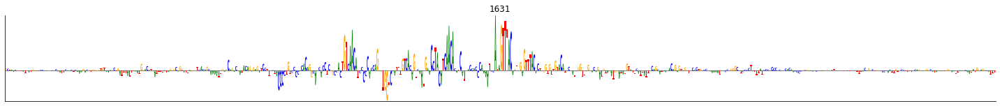

In [97]:
print(targets[cell_line])
# left_idr_motif_indx = find_seqs_with_motif(best_seqs[mask_by_hepg2], motif_pattern, thresholded_X, model, cell_line)
np.random.seed(42)
for i in selected_ids[:50]:
    explainer = explain.Explainer(model, class_index=cell_line)
    X_sample = np.expand_dims(thresholded_X[i], axis=0)
    saliency_scores = explainer.saliency_maps(X_sample)
    # plot attribution maps in a narrow range about max saliency value
    explain.plot_saliency_logos(saliency_scores, X_sample, window=256)
    plt.title(str(i))

HepG2


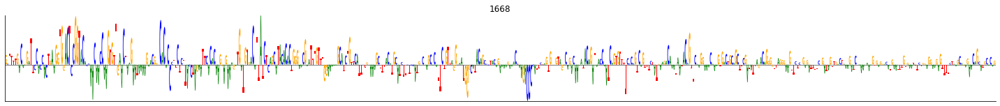

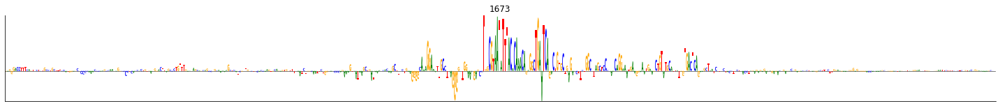

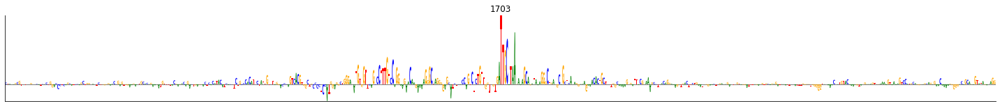

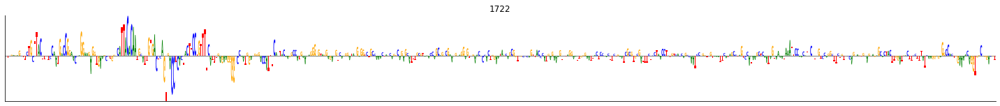

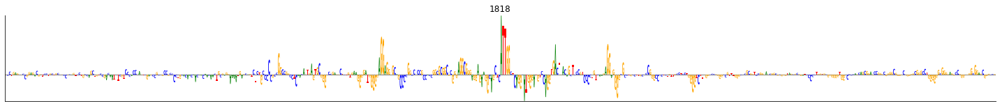

...

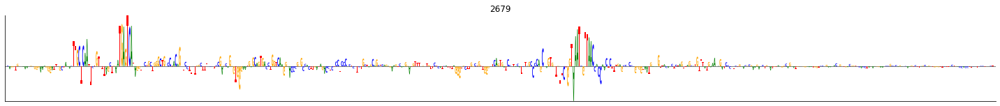

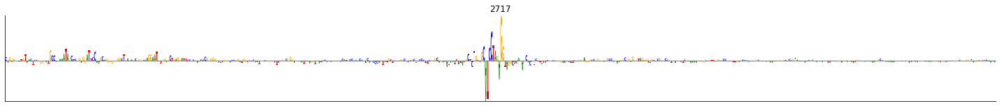

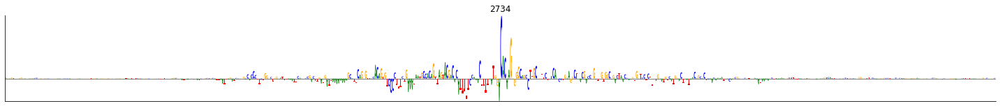

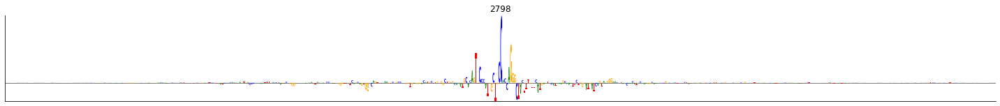

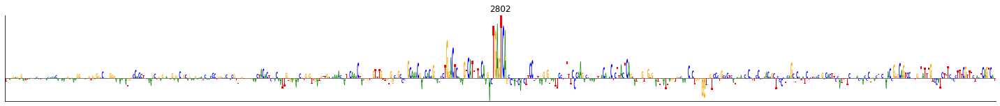

In [98]:
print(targets[cell_line])
# left_idr_motif_indx = find_seqs_with_motif(best_seqs[mask_by_hepg2], motif_pattern, thresholded_X, model, cell_line)
np.random.seed(42)
for i in selected_ids[50:100]:
    explainer = explain.Explainer(model, class_index=cell_line)
    X_sample = np.expand_dims(thresholded_X[i], axis=0)
    saliency_scores = explainer.saliency_maps(X_sample)
    # plot attribution maps in a narrow range about max saliency value
    explain.plot_saliency_logos(saliency_scores, X_sample, window=256)
    plt.title(str(i))

# PC-3

PC-3
Choosing only IDR


<AxesSubplot:xlabel='UMAP 1', ylabel='UMAP 2'>

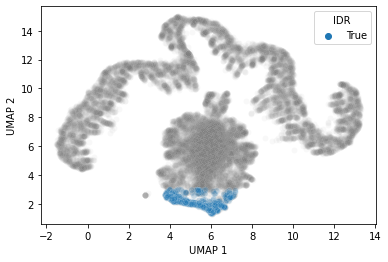

In [91]:
cell_line = 13
print(targets[cell_line])
embeddings = all_emb[cell_line]
sns.scatterplot(data=embeddings, x='UMAP 1', y='UMAP 2', color='grey', alpha=0.05)
selected = embed.select(embeddings,lower_lim_1=2, upper_lim_1=8, upper_lim_2=3, idr='y')
sns.scatterplot(data=embeddings[selected], x='UMAP 1', y='UMAP 2', hue='IDR', alpha=0.2)
selected_ids = list(embeddings[selected].index)
len(selected_ids)




459

PC-3


../explain.py:972: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1,figsize=[20, 2])


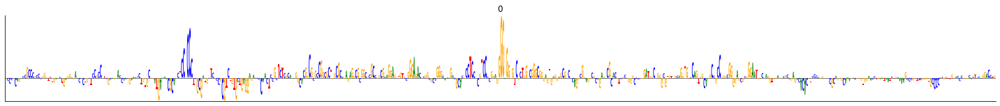

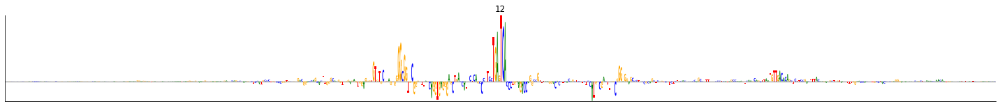

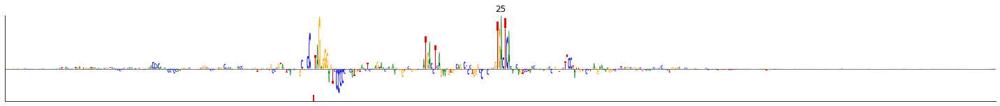

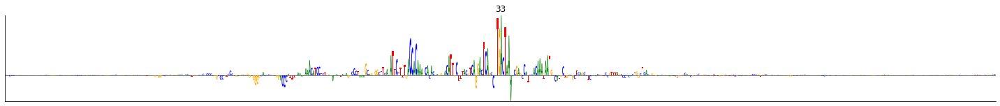

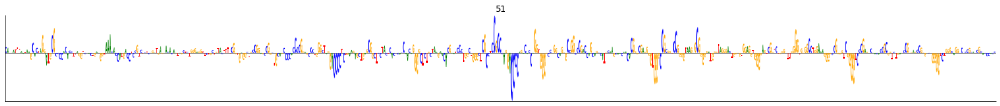

...

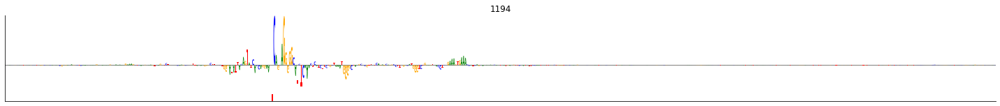

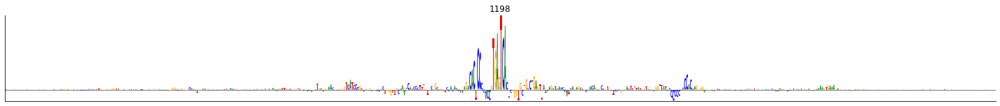

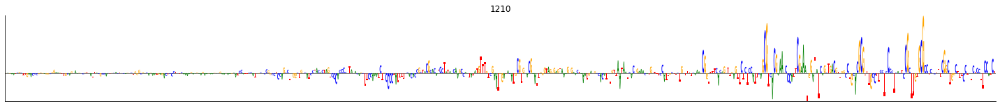

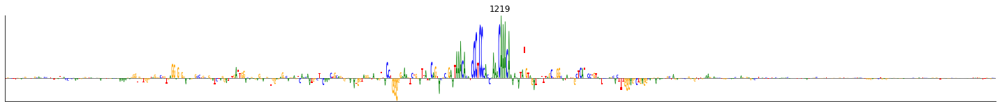

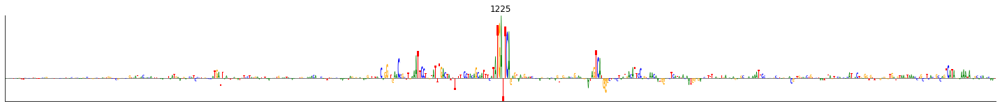

In [93]:
print(targets[cell_line])
# left_idr_motif_indx = find_seqs_with_motif(best_seqs[mask_by_hepg2], motif_pattern, thresholded_X, model, cell_line)
np.random.seed(42)
for i in selected_ids[:50]:
    explainer = explain.Explainer(model, class_index=cell_line)
    X_sample = np.expand_dims(thresholded_X[i], axis=0)
    saliency_scores = explainer.saliency_maps(X_sample)
    # plot attribution maps in a narrow range about max saliency value
    explain.plot_saliency_logos(saliency_scores, X_sample, window=256)
    plt.title(str(i))

PC-3


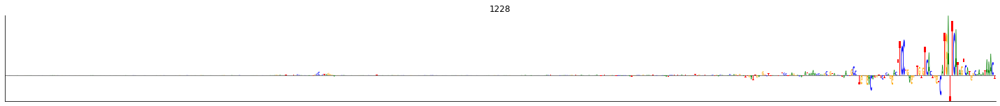

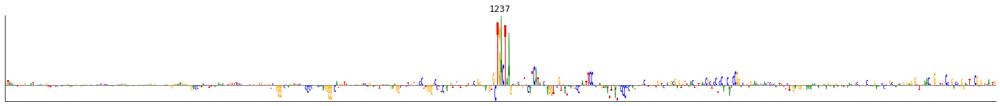

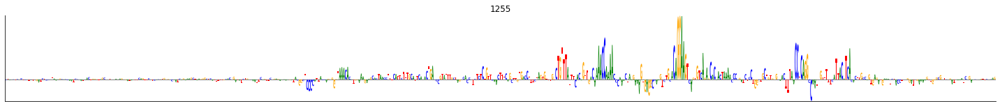

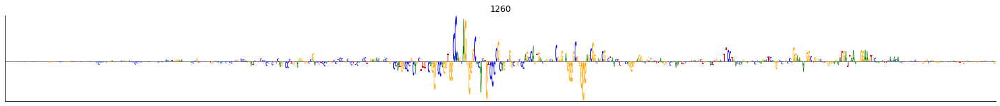

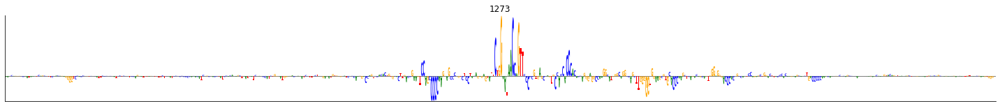

...

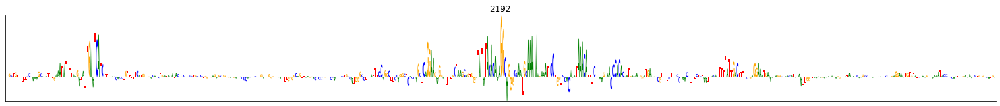

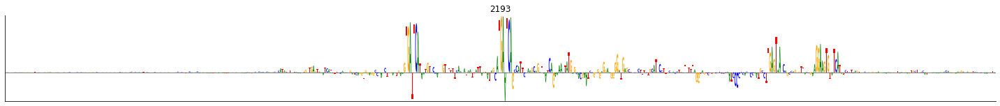

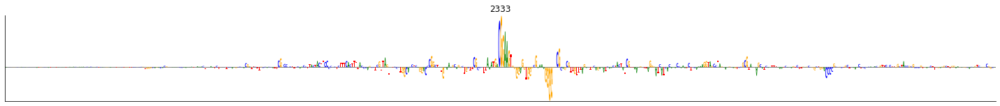

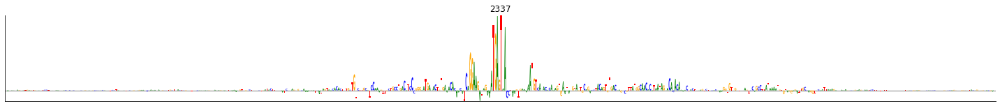

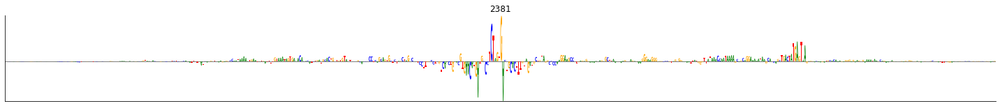

In [94]:
print(targets[cell_line])
# left_idr_motif_indx = find_seqs_with_motif(best_seqs[mask_by_hepg2], motif_pattern, thresholded_X, model, cell_line)
np.random.seed(42)
for i in selected_ids[50:100]:
    explainer = explain.Explainer(model, class_index=cell_line)
    X_sample = np.expand_dims(thresholded_X[i], axis=0)
    saliency_scores = explainer.saliency_maps(X_sample)
    # plot attribution maps in a narrow range about max saliency value
    explain.plot_saliency_logos(saliency_scores, X_sample, window=256)
    plt.title(str(i))

In [100]:
cell_line=13
_, X_13, Y_13 = embed.threshold_cell_line_testset(testset, cell_line)
predictions_thresholded = embed.predict_np(X_13, model, 
                                           batch_size=32, 
                                           reshape_to_2D=False)
ind_top_100_pc3 = predictions_thresholded[:,:,cell_line].max(axis=1).argsort()[-100:]

PC-3


100

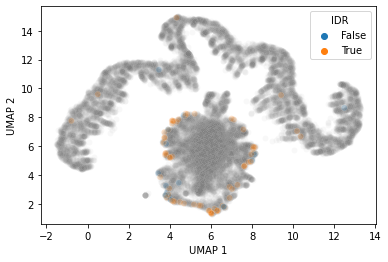

In [114]:
cell_line = 13
print(targets[cell_line])
embeddings = all_emb[cell_line]
sns.scatterplot(data=embeddings, x='UMAP 1', y='UMAP 2', color='grey', alpha=0.05)
selected = ind_top_100_pc3
sns.scatterplot(data=embeddings.iloc[selected], x='UMAP 1', y='UMAP 2', hue='IDR', alpha=0.2)
selected_ids = list(embeddings.iloc[selected].index)
len(selected)

PC-3


../explain.py:972: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, ax = plt.subplots(1,1,figsize=[20, 2])


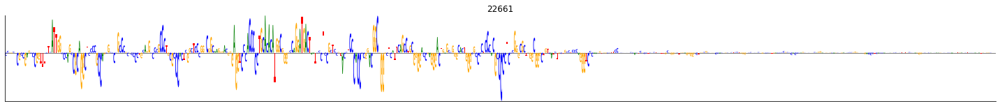

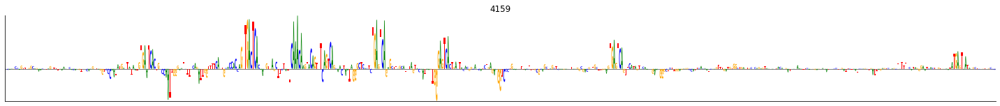

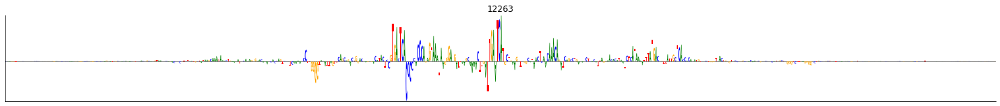

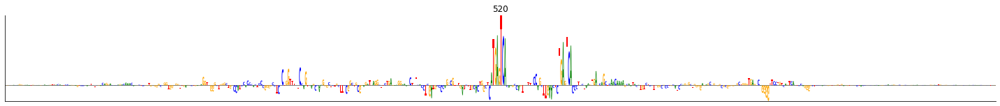

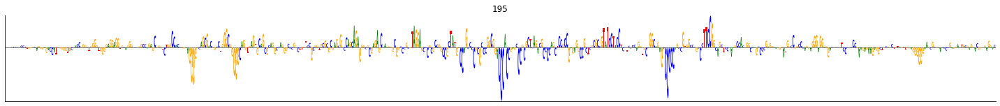

...

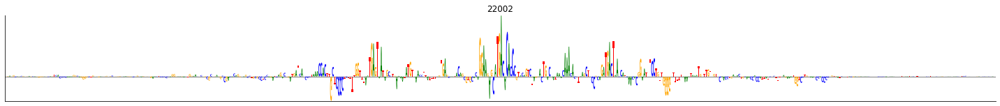

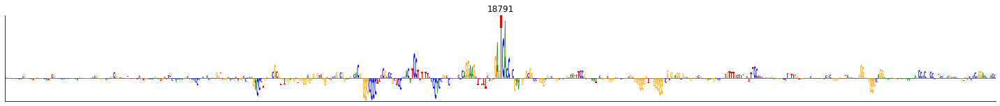

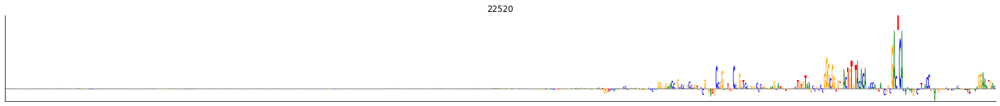

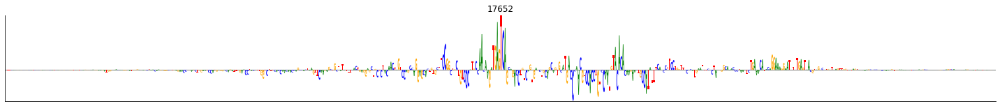

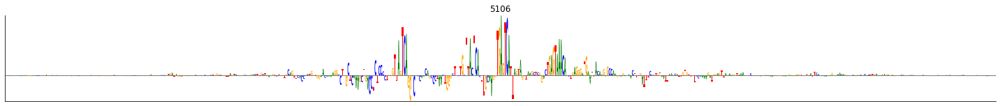

In [117]:
print(targets[cell_line])
# left_idr_motif_indx = find_seqs_with_motif(best_seqs[mask_by_hepg2], motif_pattern, thresholded_X, model, cell_line)
np.random.seed(42)
for i in selected_ids:
    explainer = explain.Explainer(model, class_index=cell_line)
    X_sample = np.expand_dims(X_13[i], axis=0)
    saliency_scores = explainer.saliency_maps(X_sample)
    # plot attribution maps in a narrow range about max saliency value
    explain.plot_saliency_logos(saliency_scores, X_sample, window=256)
    plt.title(str(i))

In [18]:
# slice different parts of the seamonster
colorblind_pallete = ["#000000","#004949","#009292","#ffb6db", #"#ff6db6",
                     "#490092","#006ddb","#b66dff","#6db6ff","#b6dbff",
                     "#920000","#924900","#db6d00","#24ff24","#ffff6d"]

conditions = {'left IDR': embed.select(embeddings, upper_lim_1=-1, lower_lim_2=5, idr='y'),
              'right IDR': embed.select(embeddings, lower_lim_1=4, upper_lim_2=6, idr='y'),
              'top IDR': embed.select(embeddings, lower_lim_1=3, lower_lim_2=11, idr='y'),
              'center IDR': embed.select(embeddings, lower_lim_1=1, 
                                   upper_lim_1=3, lower_lim_2=5, upper_lim_2=8, idr='y')
             }

#'left non-IDR':((embeddings['UMAP 1']<-1)&(embeddings['UMAP 2']>5)&(embeddings['IDR']!=True), '#05B9F3'),
#'top non-IDR':((embeddings['UMAP 1']>4)&(embeddings['UMAP 2']<6)&(embeddings['IDR']!=True), colorblind_pallete[7]),
#'right non-IDR':((embeddings['UMAP 1']>3)&(embeddings['UMAP 2']>10)&(embeddings['IDR']!=True), colorblind_pallete[13]

# conditions[] =  ((((embeddings['UMAP 1']>0.5)&
#      (embeddings['UMAP 1']<4.8)&
#      (embeddings['UMAP 2']>5)&
#      (embeddings['UMAP 2']<8)&
#      (embeddings['UMAP 2']>7.8)&  
#      (embeddings['IDR']!=True)),'center non-IDR' , colorblind_pallete[11]))


Choosing only IDR
Choosing only IDR
Choosing only IDR
Choosing only IDR


In [19]:
# add splice labels
labels = np.array(['IDR' if e else 'non-IDR' for e in embeddings['IDR'].values])
labels = labels.astype('U25')
color_correspondance = {'non-IDR':'#B2BABB', 
                        'IDR':'#FF5733'}
for i, (l, c) in enumerate(conditions.items()):
    print(l)
    labels[c] = l
    color_correspondance[l] = colorblind_pallete[i+1]
embeddings['labels'] = labels

left IDR
right IDR
top IDR
center IDR


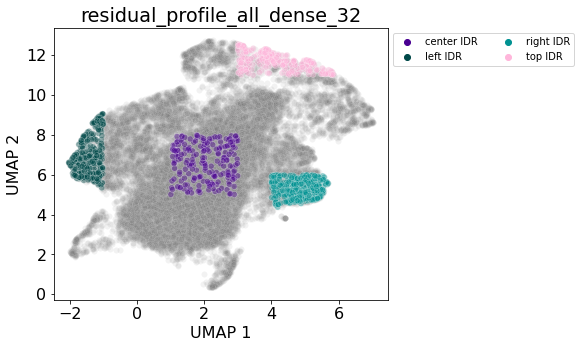

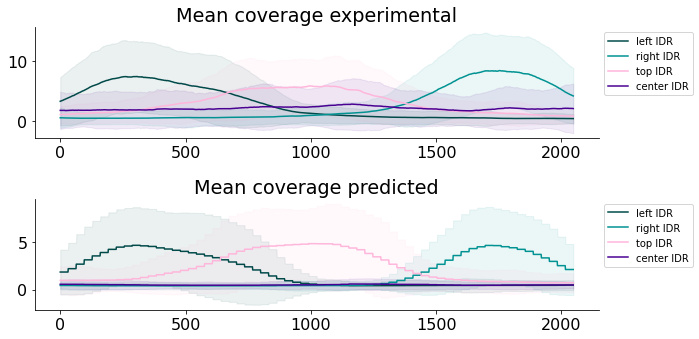

In [22]:
# plot seamosnter with slices and avg coverage
font = {'size': 16}
matplotlib.rc('font', **font)
fig, ax = plt.subplots(1,figsize=[6,5])

sns.scatterplot(data=embeddings,
               x='UMAP 1', y='UMAP 2',
               alpha=0.1, 
               color='grey',
               ax=ax)
df = embeddings.sort_values('labels')
df = df[(df['labels']!='IDR')&(df['labels']!='non-IDR')]
sns.scatterplot(data=df,
               x='UMAP 1', y='UMAP 2',
               hue='labels', alpha=0.4, 
               palette=color_correspondance,
               ax=ax)

ax.legend(loc='upper left', bbox_to_anchor=(1,1), 
                ncol=2, prop={'size': 10})
ax.set_title(embed.describe_run(run_path).split(' ')[1])
# plt.style.use('seaborn-white')
fig, axs = plt.subplots(2,1,figsize=[10,5])
data_and_labels = [(thresholded_Y[c], l, color_correspondance[l]) for l, c in conditions.items()]
plot_mean_coverages(data_and_labels, axs[0])

data_and_labels = [(np.repeat(predictions[:,:,cell_line][c], bin_size, axis=1), l, color_correspondance[l]) for l, c in conditions.items()]
plot_mean_coverages(data_and_labels, axs[1])
for i, title in enumerate(["Mean coverage experimental", 'Mean coverage predicted']):    
#     axs[i].set_ylim(0, ax.get_ylim()[1]+2)
    axs[i].legend(loc='upper left', bbox_to_anchor=(1,1), 
                  prop={'size': 10})
    axs[i].spines['top'].set_visible(False)
    axs[i].spines['right'].set_visible(False)
    axs[i].set_title(title)

plt.tight_layout()